<a href="https://colab.research.google.com/github/ZakeC1/MathsProject/blob/main/LexicalGraphAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Cairo Initialise 

In [1]:
!echo "deb http://downloads.skewed.de/apt focal main" >> /etc/apt/sources.list
!apt-key adv --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
!apt-get update
!apt-get install python3-graph-tool python3-matplotlib python3-cairo

Executing: /tmp/apt-key-gpghome.uPuJNBthT8/gpg.1.sh --keyserver keyserver.ubuntu.com --recv-key 612DEFB798507F25
gpg: key 612DEFB798507F25: "Tiago de Paula Peixoto <tiago@skewed.de>" not changed
gpg: Total number processed: 1
gpg:              unchanged: 1
Hit:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Hit:3 http://security.ubuntu.com/ubuntu focal-security InRelease
Hit:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease
Hit:5 http://archive.ubuntu.com/ubuntu focal InRelease
Hit:6 http://archive.ubuntu.com/ubuntu focal-updates InRelease
Hit:7 http://ppa.launchpad.net/cran/libgit2/ubuntu focal InRelease
Hit:8 http://archive.ubuntu.com/ubuntu focal-backports InRelease
Hit:9 http://downloads.skewed.de/apt focal InRelease
Hit:10 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu focal InRelease
Hit:11 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu foc

In [2]:
!apt purge python3-cairo
!apt install libcairo2-dev pkg-config python3-dev
!pip install --force-reinstall pycairo
!pip install zstandard


Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following packages will be REMOVED:
  python3-cairo*
0 upgraded, 0 newly installed, 1 to remove and 26 not upgraded.
After this operation, 270 kB disk space will be freed.
(Reading database ... 126754 files and directories currently installed.)
Removing python3-cairo:amd64 (1.16.2-2ubuntu2) ...
W: Target Packages (main/binary-amd64/Packages) is configured multiple times in /etc/apt/sources.list:52 and /etc/apt/sources.list:53
W: Target Packages (main/binary-all/Packages) is configured multiple times in /etc/apt/sources.list:52 and /etc/apt/sources.list:53
Reading package lists... Done
Building dependency tree       
Reading state information... Done
libcairo2-dev is already the newest version (1.16.0-4ubuntu1).
pkg-config is already the newest version (0.29.1-0ubuntu4).
python3-dev is already the newest version (3.8.2-0ubuntu2).
0 upgraded, 0 newly installed, 0 to remove and 26 not upgra

# Alternative Conda Initialisation (Only use when Cairo doesn't work)

In [ ]:
#Install Miniconda

%%time
%%capture


import sys


# unset pythonpath env var before installing conda
!usnet PYTHONPATH=


# download and install miniconda for this particular version of python
!wget https://repo.anaconda.com/miniconda/Miniconda3-py38_22.11.1-1-Linux-x86_64.sh
!bash Miniconda3-py38_22.11.1-1-Linux-x86_64.sh -b -f -p /usr/local
!conda install --channel defaults conda python=3.8.15 --yes
!conda update --channel defaults --all --yes
!conda update --name base conda --yes


# append to `sys.path`
sys.path.append("/usr/local/lib/python3.8/site-packages")

CPU times: user 380 ms, sys: 81 ms, total: 461 ms
Wall time: 1min 1s


In [ ]:
#Install Graph-Tools library

%%time
%%capture

!conda install -c conda-forge -c flyem-forge scikit-learn graph-tool pygobject cairo gtk3

# Start Test

In [3]:
%matplotlib inline

In [4]:
from graph_tool.all import *

g = collection.data["celegansneural"]
state = minimize_nested_blockmodel_dl(g)

/usr/lib/python3/dist-packages/graph_tool/draw/cairo_draw.py:1544: RuntimeWarning: Error importing Gtk module: cannot import name '_gi' from partially initialized module 'gi' (most likely due to a circular import) (/usr/lib/python3/dist-packages/gi/__init__.py); GTK+ drawing will not work.
  warnings.warn(msg, RuntimeWarning)


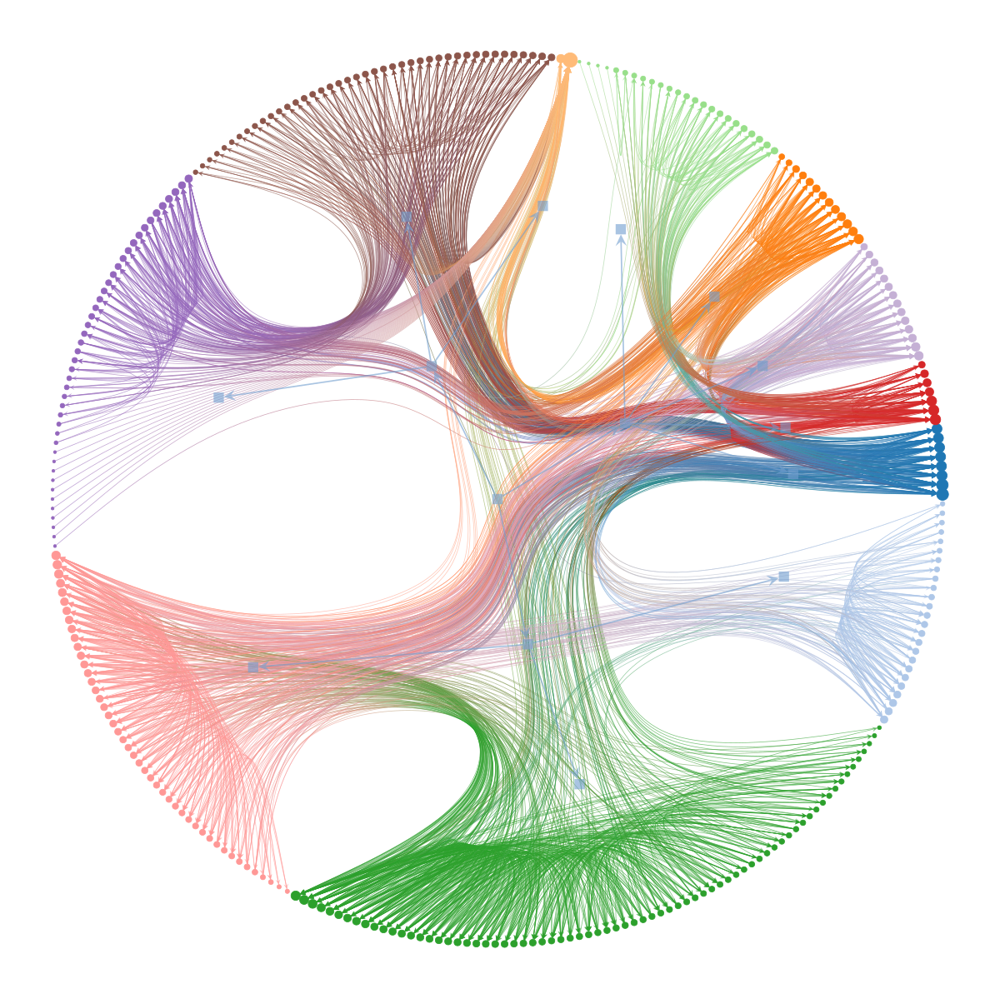

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd45fa2a1a0, at 0x7fd421667160>,
 <GraphView object, directed, with 312 vertices and 311 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fd4216643d0, at 0x7fd4216824d0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fd4216643d0, at 0x7fd4216823e0>, False), at 0x7fd4216643d0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fd4216643d0, at 0x7fd4216828c0>)

In [5]:
state.draw()

# Making a graph from an array

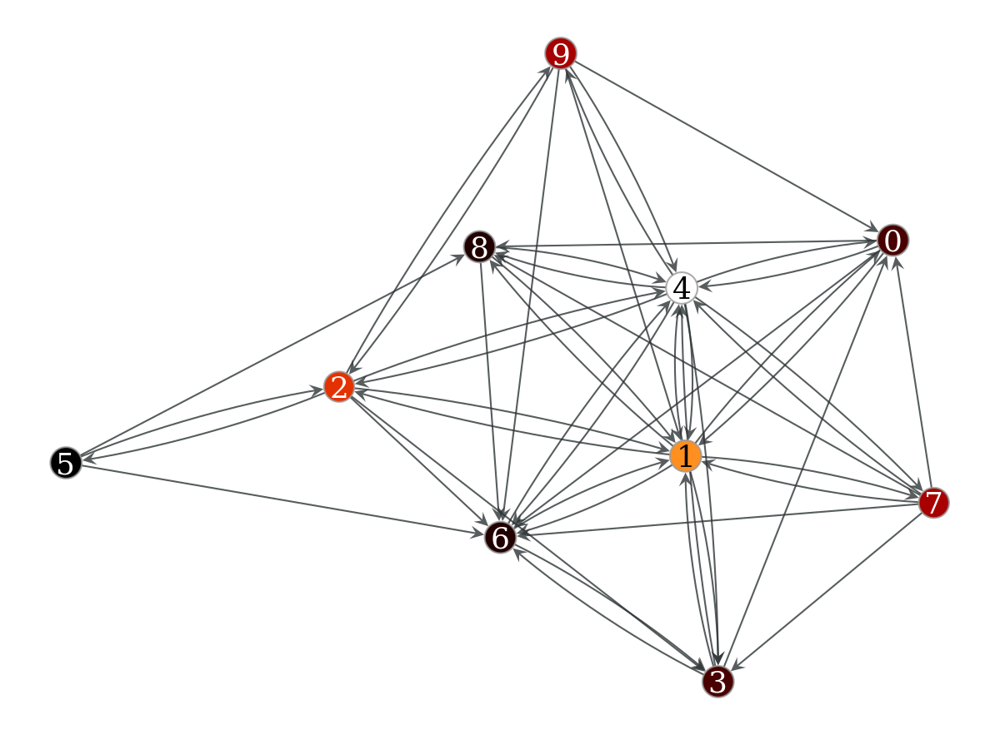

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f9c28092190, at 0x7f9c280a47f0>

In [ ]:
from graph_tool.all import *
import matplotlib
import numpy as np
 
knoki = [ [ 0, 1, 0, 0, 1, 0, 1, 0, 1, 0 ]
        , [ 1, 0, 1, 1, 1, 0, 1, 1, 1, 0 ]
        , [ 0, 1, 0, 1, 1, 1, 1, 0, 0, 1 ]
        , [ 1, 1, 0, 0, 1, 0, 1, 0, 0, 0 ]
        , [ 1, 1, 1, 1, 0, 0, 1, 1, 1, 1 ]
        , [ 0, 0, 1, 0, 0, 0, 1, 0, 1, 0 ]
        , [ 0, 1, 0, 1, 1, 0, 0, 0, 0, 0 ]
        , [ 1, 1, 0, 1, 1, 0, 1, 0, 1, 0 ]
        , [ 0, 1, 0, 0, 1, 0, 1, 0, 0, 0 ]
        , [ 1, 1, 1, 0, 1, 0, 1, 0, 0, 0 ] ]

N = len( knoki )
g = Graph()
g.set_directed( True )
v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
    for j in range(N):
        if knoki[i][j] == 1:
            g.add_edge( v[i], v[j] )

g = GraphView( g, vfilt=label_largest_component(g) )
c = closeness( g )
graph_draw( g, vertex_fill_color=c,
               vertex_size=prop_to_size(c, mi=5, ma=15),
               vcmap=matplotlib.cm.gist_heat,
               vorder=c,
               vertex_text=g.vertex_index,
               vertex_font_size=18 )

# Basic Trophic coherence + other properties

[[ 3. -2. -2. ...  0.  0.  0.]
 [-2. 14. -2. ...  0.  0.  0.]
 [-2. -2. 33. ...  0.  0. -2.]
 ...
 [ 0.  0.  0. ...  1.  0.  0.]
 [ 0.  0.  0. ...  0.  2.  0.]
 [ 0.  0. -2. ...  0.  0.  1.]]


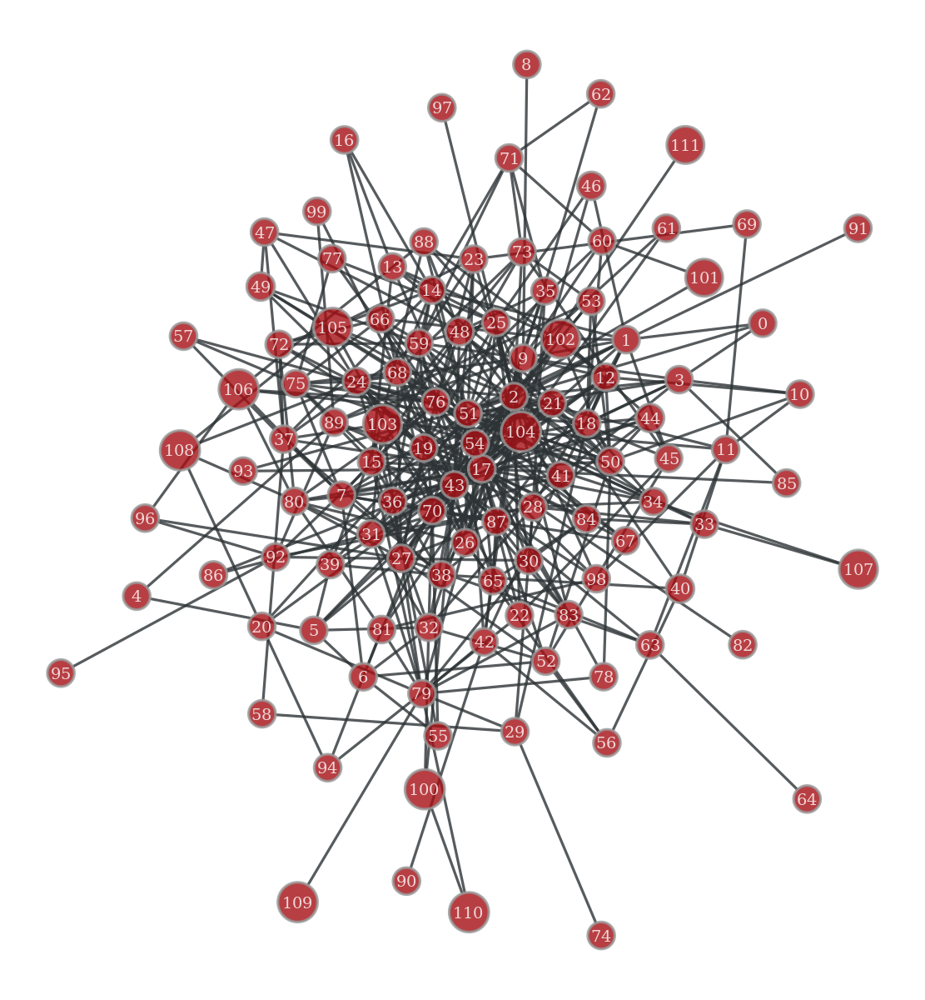

[ 0.          0.72998318  0.81592933  0.638266    0.93452155  0.98129873
  0.77419335  0.58867994  1.40384627  1.20192314  0.89206053  0.80716058
  1.13114561  1.32297866  1.13848766  0.97545812  1.43520402  0.96829316
  1.31331463  0.76391346  1.10611316  0.93084319  0.90998961  0.55786748
  0.88324064  0.79922064  0.97712431  1.04322835  1.03022562  0.64858428
  0.90733579  0.98442465  1.16540649  1.6761213   1.36260934  1.45256804
  0.89524693  0.42233454  0.55612923  0.96304069  0.55760424  0.55815864
  0.62281955  1.08586197  1.23808779  1.08988464  0.73321761  0.46006545
  0.98205939  0.80466158  1.20754886  0.89838962  0.94244296  1.48324516
  1.20424969  0.7463623   0.54999553  0.39700026  0.07091882  1.07861853
  2.31140907  1.27254573  2.61003688  1.67718832  2.35437664  1.40234326
  0.84357706  1.00362222  1.19133971  0.36502806  0.95010318  2.40811375
  0.77109103  1.63322106  0.29716855  0.77477621  1.14537247  0.69486001
  1.54775441  1.40983307  0.91808212  1.18932738  0

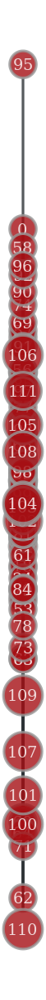

0.00010146428641726447
0.03650411805754731
0.12867269543314214
0.010832326104182348
0.00018330018330018328
0.012702534361337763
0.004200723589456116
0.007910691322152273
0.0
0.07084394438217555
0.0008305578760124211
0.013721912248053341
0.009119718025150058
0.004765026783491315
0.018315379857100918
0.0161985835786516
0.0001255801255801256
0.24468528792139305
0.028769397398990756
0.006882369124110393
0.005717827066089325
0.005943625458132285
0.010339429436746332
0.016821790519645583
0.029643593563897997
0.01924465400836694
0.020509778101018332
0.04336725956099178
0.033891942804989195
0.024666416340468653
0.010727605342333775
0.01958598610414419
0.011710164382272278
0.005474659597535361
0.014667134024508708
0.004630020614008615
0.008201437734171268
0.020392765238029766
0.00994279446524924
0.0019059246761471999
0.002520201799198665
0.0041105938659105465
0.02547657021277985
0.09745558823854311
0.0033697640641361334
0.002578484535950233
0.00020839020839020838
0.0017928326106656724
0.0080465

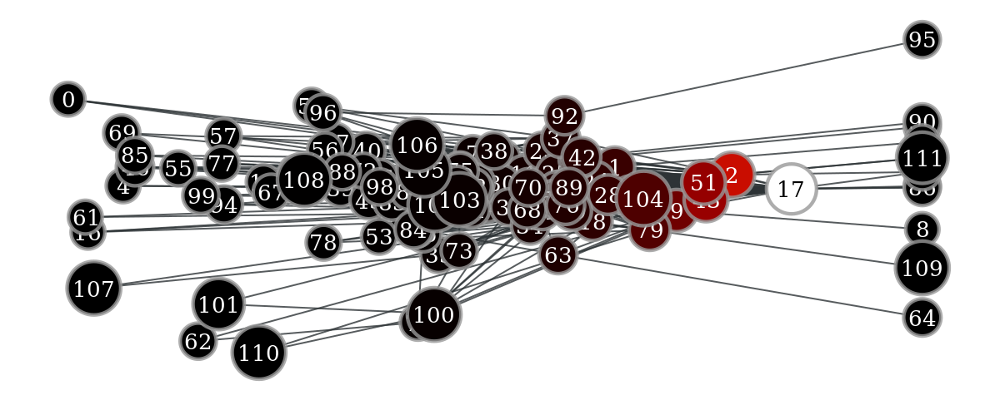

0.6666666666666666
0.15384615384615385
0.13257575757575757
0.19444444444444445
0.0
0.2857142857142857
0.26666666666666666
0.2909090909090909
0.0
0.10294117647058823
0.16666666666666666
0.09523809523809523
0.26666666666666666
0.26666666666666666
0.22727272727272727
0.22727272727272727
0.6666666666666666
0.11649659863945579
0.18681318681318682
0.0
0.0
0.3333333333333333
0.2
0.14285714285714285
0.1619047619047619
0.21978021978021978
0.2
0.13333333333333333
0.14102564102564102
0.0
0.13333333333333333
0.22727272727272727
0.26666666666666666
0.1
0.42857142857142855
0.26666666666666666
0.42857142857142855
0.17777777777777778
0.25
0.1
0.0
0.25
0.14285714285714285
0.0873015873015873
0.3333333333333333
0.2
0.3333333333333333
0.1
0.2222222222222222
0.4
0.29523809523809524
0.12962962962962962
0.19047619047619047
0.26666666666666666
0.3076923076923077
0.0
0.0
0.0
0.0
0.14102564102564102
0.0
0.0
0.0
0.1
0.0
0.2
0.3333333333333333
0.3333333333333333
0.15151515151515152
0.0
0.18181818181818182
0.06666

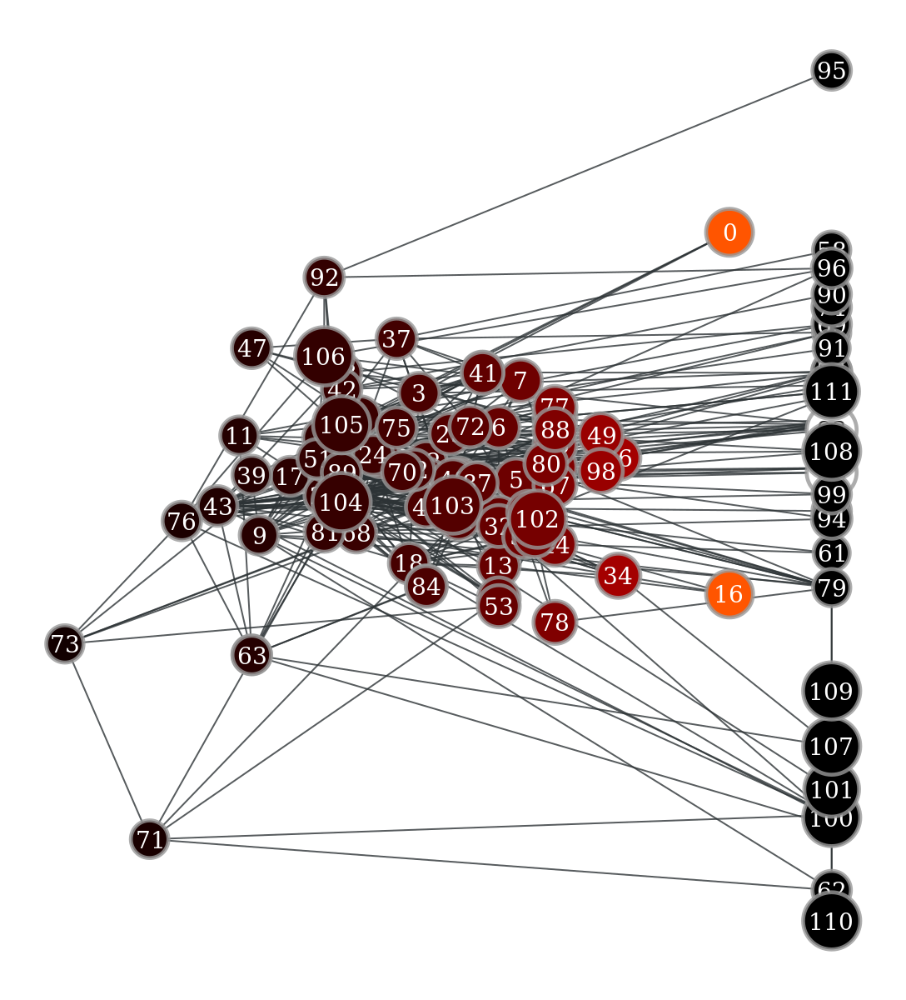

NameError: ignored

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

#g = collection.ns["cs_department"]
#g = collection.ns["karate/77"]
#g = collection.ns["law_firm"]
g = collection.ns["adjnoun"]

adj = [ [ 1, 0, 1]
        , [ 1, 0, 1]
        , [ 1, 1, 0]]

#N = len(adj)
#g = Graph()
#g.set_directed( True )
#v = [ g.add_vertex() for i in range(N) ]
#for i in range(N):
#    for j in range(N):
#        if adj[i][j] != 0:
#            g.add_edge( v[i], v[j] )

#edges = g2.get_edges()
#in_degs = g2.get_in_degrees(g2.get_vertices())
#out_degs = g2.get_out_degrees(g2.get_vertices())
#print((out_degs[edges[:,0]] * in_degs[edges[:,1]]).sum())

#print(graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).toarray())
#print(graph_tool.spectral.laplacian(g, operator=False, csr=True).toarray())

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
graph_draw(g, vertex_text=g.vertex_index)

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

pos = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos[g.vertex(i)] = (0, h2[i])

graph_draw(g, pos=pos, vertex_text=g.vertex_index)

vp, ep = graph_tool.centrality.betweenness(g)

for i in range(len(g.get_vertices())):
    if vp[i] == 0:
      pos[g.vertex(i)] = (vp[i], h2[i])
    else:
      pos[g.vertex(i)] = (np.log(vp[i]), h2[i])
    print(vp[i])


#name = g.vertex_properties["label"]
#print(name[0])
graph_draw(g, pos=pos, vertex_text=g.vertex_index, vertex_fill_color=vp, vertex_size=prop_to_size(vp, mi=20, ma=30),
              edge_pen_width=prop_to_size(ep, mi=1, ma=1),
              vcmap=matplotlib.cm.gist_heat)


lc = local_clustering(g)
for i in range(len(g.get_vertices())):
    if lc[i] == 0:
      pos[g.vertex(i)] = (lc[i], h2[i])
    else:
      pos[g.vertex(i)] = (np.log(lc[i]), h2[i])
    print(lc[i])

graph_draw(g, pos=pos, vertex_text=g.vertex_index, vertex_fill_color=lc, vertex_size=prop_to_size(lc, mi=20, ma=30),
              edge_pen_width=prop_to_size(ep, mi=1, ma=1),
              vcmap=matplotlib.cm.gist_heat)

#For Planar Graphs Only
#pos = planar_layout(g)
#graph_draw(g, pos=pos)
plt.show()

# Subplots Example

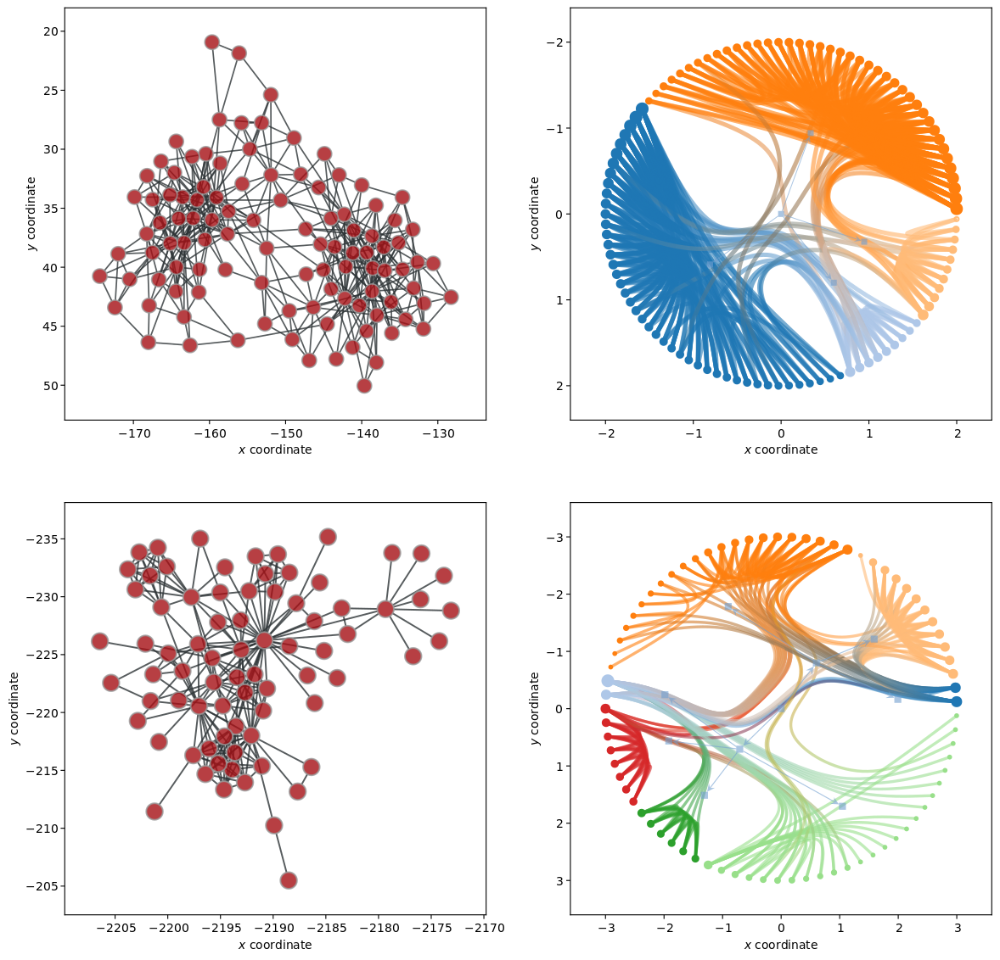

In [ ]:
import graph_tool.all as gt
import matplotlib.pyplot as plt
%matplotlib inline

plt.switch_backend("cairo")

fig, ax = plt.subplots(2, 2, figsize=(12, 11.5))

g = gt.collection.data["polbooks"]

gt.graph_draw(g, g.vp.pos, vertex_size=1.5, mplfig=ax[0,0])

ax[0,0].set_xlabel("$x$ coordinate")
ax[0,0].set_ylabel("$y$ coordinate")

state = gt.minimize_nested_blockmodel_dl(g)

state.draw(mplfig=ax[0,1])

ax[0,1].set_xlabel("$x$ coordinate")
ax[0,1].set_ylabel("$y$ coordinate")

g = gt.collection.data["lesmis"]
gt.graph_draw(g, g.vp.pos, vertex_size=1.5, mplfig=ax[1,0])

ax[1,0].set_xlabel("$x$ coordinate")
ax[1,0].set_ylabel("$y$ coordinate")

state = gt.minimize_nested_blockmodel_dl(g)

state.draw(mplfig=ax[1,1])

ax[1,1].set_xlabel("$x$ coordinate")
ax[1,1].set_ylabel("$y$ coordinate")

plt.subplots_adjust(left=0.08, right=0.99, top=0.99, bottom=0.06)
%matplotlib inline
plt.show()

<ipython-input-6-b6220c2a8962>:11: DeprecationWarning: The module `scipy.sparse.linalg.dsolve.linsolve` is deprecated. All public names must be imported directly from the `scipy.sparse.linalg` namespace.
  from scipy.sparse.linalg.dsolve import linsolve


[[16. -2. -2. ... -2.  0.  0.]
 [-2.  9. -2. ...  0.  0.  0.]
 [-2. -2. 10. ...  0. -2.  0.]
 ...
 [-2.  0.  0. ...  6. -2. -2.]
 [ 0.  0. -2. ... -2. 12. -2.]
 [ 0.  0.  0. ... -2. -2. 16.]]
[-16.  -9. -10.  -6.  -3.  -4.  -4.  -4.  -5.  -2.  -3.  -1.  -2.  -5.
  -2.  -2.  -2.  -2.  -2.  -3.  -2.  -2.  -1.  -5.  -3.  -3.  -2.  -4.
  -3.  -4.  -4.  -6. -12. -16.]


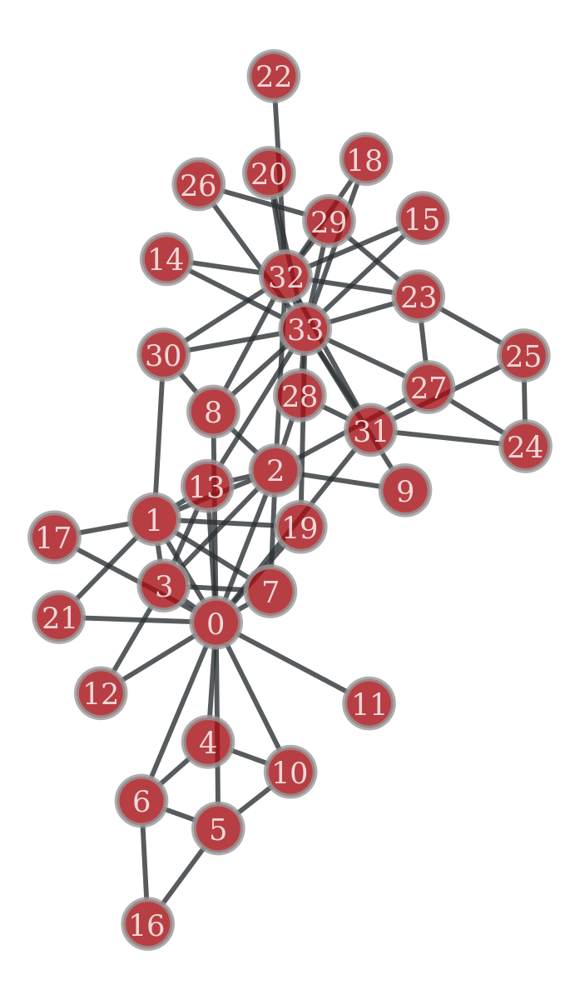

Matrix([[0], [2.12094014769569], [2.30804963539873], [2.53039414428277], [1.00000000000000], [2.00000000000000], [2.00000000000000], [2.47969196368860], [1.02851102583220], [2.22893206247800], [1.00000000000000], [-1.00000000000000], [1.53039414428269], [2.15210654178260], [0.459001561611878], [0.459001561611877], [3.00000000000000], [1.12094014769569], [0.459001561611879], [1.02788171651665], [0.459001561611877], [1.12094014769570], [0.0762382690651885], [0.734155913200442], [1.44596889347224], [1.05781988492227], [0.0349223289708742], [1.70452843457534], [1.75702472212583], [0.114039901891608], [1.30422636756988], [0.906605020710736], [0.538119134532594], [0.920882427079285]])
[ 0.          2.12094015  2.30804964  2.53039414  1.          2.
  2.          2.47969196  1.02851103  2.22893206  1.         -1.
  1.53039414  2.15210654  0.45900156  0.45900156  3.          1.12094015
  0.45900156  1.02788172  0.45900156  1.12094015  0.07623827  0.73415591
  1.44596889  1.05781988  0.03492233

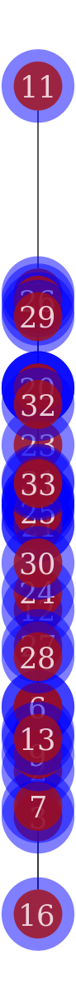

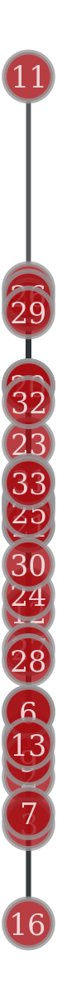

<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7f65aa0b16c0, at 0x7f65aa1087c0>

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv
from scipy.sparse.linalg import dsolve
from scipy.sparse.linalg.dsolve import linsolve
from sympy import Matrix

g = collection.ns["karate/77"]
#g = collection.ns["ugandan_village/friendship-1"]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
print(imbalance)
graph_draw(g, vertex_text=g.vertex_index)

#print(dsolve.spsolve(sparse.csr_matrix(laplacian), imbalance, use_umfpack=True))
#print(linsolve.spsolve(sparse.csr_matrix(laplacian), imbalance))

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

sol, params = Matrix(remLapl).gauss_jordan_solve(Matrix(remImb))
sol = sol.row_insert(0, Matrix([0]))
print(sol)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

pos1 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, h2[i])

pos2 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (0, sol[i])

graph_draw(g, vertex_pen_width = 0, vertex_halo = True, pos=pos1, vertex_text=g.vertex_index)
graph_draw(g, pos=pos2, vertex_text=g.vertex_index)

# Experimental

adjacency
[[0. 1. 1. 1. 1. 1. 1. 1. 1. 0. 1. 1. 1. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [1. 0. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 1. 0. 0.
  0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [1. 1. 0. 1. 0. 0. 0. 1. 1. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 1. 1. 0. 0. 0. 1. 0.]
 [1. 1. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 1. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 1. 1. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
  0. 0. 0. 0. 0. 0. 1. 0. 1. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0

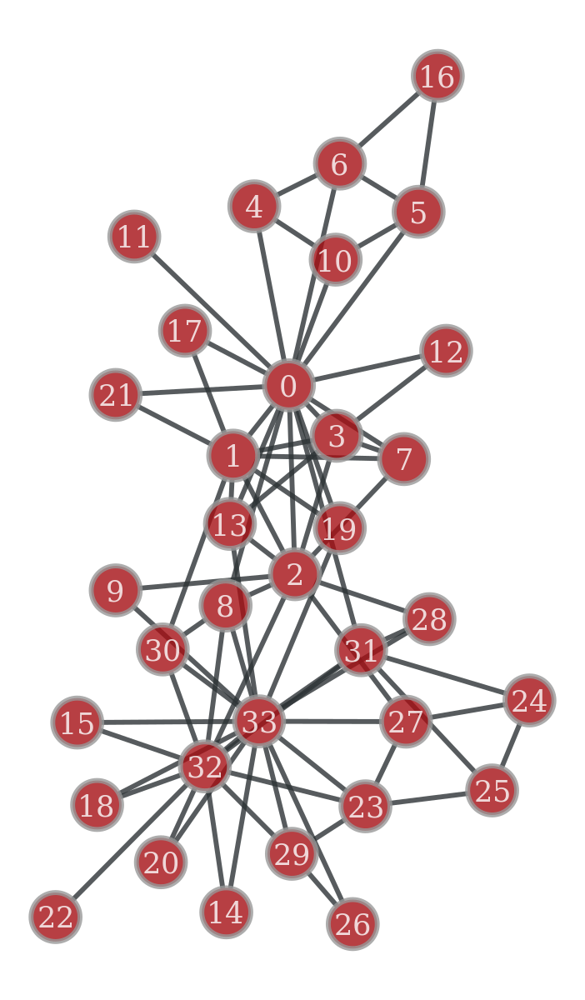

[ 0.          2.12094015  2.30804964  2.53039414  1.          2.
  2.          2.47969196  1.02851103  2.22893206  1.         -1.
  1.53039414  2.15210654  0.45900156  0.45900156  3.          1.12094015
  0.45900156  1.02788172  0.45900156  1.12094015  0.07623827  0.73415591
  1.44596889  1.05781988  0.03492233  1.70452843  1.75702472  0.1140399
  1.30422637  0.90660502  0.53811913  0.92088243]


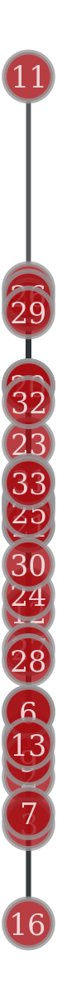

0.4376458032708033
0.053873556998557
0.15226370851370855
0.01196188071188071
0.0006313131313131313
0.029987373737373736
0.029987373737373736
0.0
0.05673701298701299
0.0008477633477633477
0.0006313131313131313
0.0
0.0
0.041591510341510346
0.0
0.0
0.0
0.0
0.0
0.02936056998556999
0.0
0.0
0.0
0.01824494949494949
0.0022095959595959595
0.0038404882154882154
0.0
0.021702140452140445
0.0017947330447330447
0.0038690476190476187
0.014727633477633477
0.1403484247234247
0.1821578884078884
0.27505561568061565
0.5689655172413793
0.4852941176470588
0.559322033898305
0.4647887323943662
0.3793103448275862
0.38372093023255816
0.38372093023255816
0.44
0.515625
0.4285714285714286
0.3793103448275862
0.3666666666666667
0.3707865168539326
0.5076923076923077
0.3707865168539326
0.3707865168539326
0.28448275862068967
0.375
0.3707865168539326
0.4925373134328358
0.3707865168539326
0.375
0.34375
0.39285714285714285
0.375
0.375
0.358695652173913
0.4520547945205479
0.44594594594594594
0.38372093023255816
0.458333333

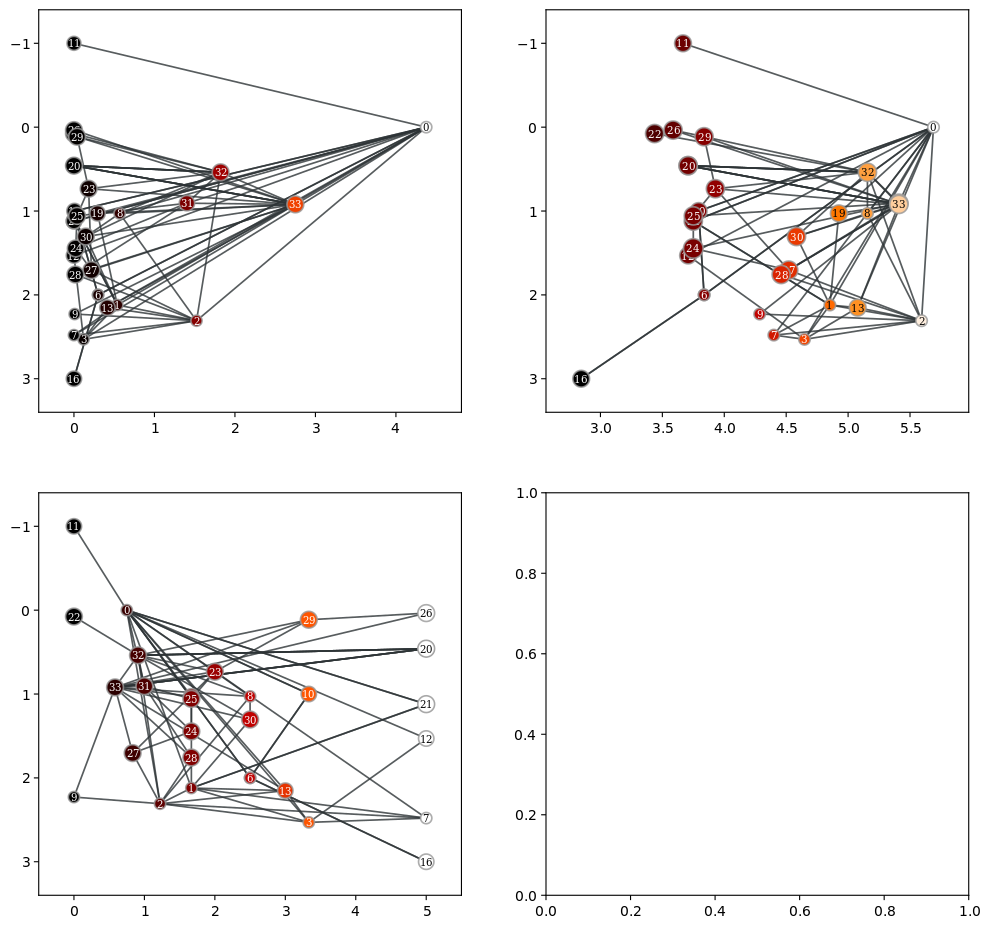

In [ ]:
%matplotlib inline
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

plt.switch_backend("cairo")
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(12, 11.5))

#g = collection.ns["cs_department"]
g = collection.ns["karate/77"]
#g = collection.ns["adjnoun"]

adj = [ [ 1, 0, 1]
        , [ 1, 0, 1]
        , [ 1, 1, 0]]

#N = len(adj)
#g = Graph()
#g.set_directed( True )
#v = [ g.add_vertex() for i in range(N) ]
#for i in range(N):
#    for j in range(N):
#        if adj[i][j] != 0:
#            g.add_edge( v[i], v[j] )

#edges = g2.get_edges()
#in_degs = g2.get_in_degrees(g2.get_vertices())
#out_degs = g2.get_out_degrees(g2.get_vertices())
#print((out_degs[edges[:,0]] * in_degs[edges[:,1]]).sum())

#print(graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).toarray())
#print(graph_tool.spectral.laplacian(g, operator=False, csr=True).toarray())

#name = g.vertex_properties["label"]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=None, vindex=None, operator=False, csr=True).transpose()
adj = adjacency.toarray()
np.set_printoptions(threshold=np.inf)
print("adjacency")
print(adj)
print("laplcian")
laplacian = np.diag(strength) - (adjacency + adjacency.transpose())
print(laplacian)
graph_draw(g, vertex_text=g.vertex_index)
#graph_draw(g, vertex_text=g.vertex_index, vertex_size=1, mplfig=ax1)

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)
print(h2)

#x axis too small?
pos1 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, h2[i])

graph_draw(g, pos=pos1, vertex_text=g.vertex_index)
#graph_draw(g, pos=pos1, vertex_pen_width = 0, vertex_text=g.vertex_index, vertex_size = 0.1, edge_pen_width = 0.01, mplfig=ax1)
ax2.set_xlim([-1, 1])
ax2.set_ylim([-2, 4])

vp, ep = graph_tool.centrality.betweenness(g)

pos2 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (vp[i]*10, h2[i])
    print(vp[i])

graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp,
              vcmap=matplotlib.cm.gist_heat, mplfig=ax1)
#graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vertex_size=prop_to_size(vp, mi=0, ma=0.025),
#              edge_pen_width=prop_to_size(ep, mi=0, ma=0.01),
#              vcmap=matplotlib.cm.gist_heat, mplfig=ax3)

cp = graph_tool.centrality.closeness(g)

pos4 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos4[g.vertex(i)] = (cp[i]*10, h2[i])
    print(cp[i])

graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat, mplfig=ax2)

lc = local_clustering(g)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
    pos3[g.vertex(i)] = (lc[i]*5, h2[i])
    print(lc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=lc,
              vcmap=matplotlib.cm.gist_heat, mplfig=ax3)
#graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=lc, vertex_size=prop_to_size(lc, mi=0, ma=0.005),
#              edge_pen_width=prop_to_size(ep, mi=0, ma=0.01),
#              vcmap=matplotlib.cm.gist_heat, mplfig=ax4)

%matplotlib inline
plt.show()
#For Planar Graphs Only
#pos = planar_layout(g)
#graph_draw(g, pos=pos)


# Converting sentences into graphs normalised Western


['in', 'times', 'past', 'there', 'lived', 'a', 'king', 'and', 'queen', 'who', 'said', 'to', 'each', 'other', 'every', 'day', 'of', 'their', 'lives', 'would', 'that', 'we', 'had', 'a', 'child', '!', 'and', 'yet', 'they', 'had', 'none', '.', 'but', 'it', 'happened', 'once', 'that', 'when', 'the', 'queen', 'was', 'bathing', 'there', 'came', 'a', 'frog', 'out', 'of', 'the', 'water', 'and', 'he', 'squatted', 'on', 'the', 'ground', 'and', 'said', 'to', 'her', 'thy', 'wish', 'shall', 'be', 'fulfilled', 'before', 'a', 'year', 'has', 'gone', 'by', 'thou', 'shalt', 'bring', 'a', 'daughter', 'into', 'the', 'world', '.', 'and', 'as', 'the', 'frog', 'foretold', 'so', 'it', 'happened', 'and', 'the', 'queen', 'bore', 'a', 'daughter', 'so', 'beautiful', 'that', 'the', 'king', 'could', 'not', 'contain', 'himself', 'for', 'joy', 'and', 'he', 'ordained', 'a', 'great', 'feast', '.', 'not', 'only', 'did', 'he', 'bid', 'to', 'it', 'his', 'relations', 'friends', 'and', 'acquaintances', 'but', 'also', 'the', 

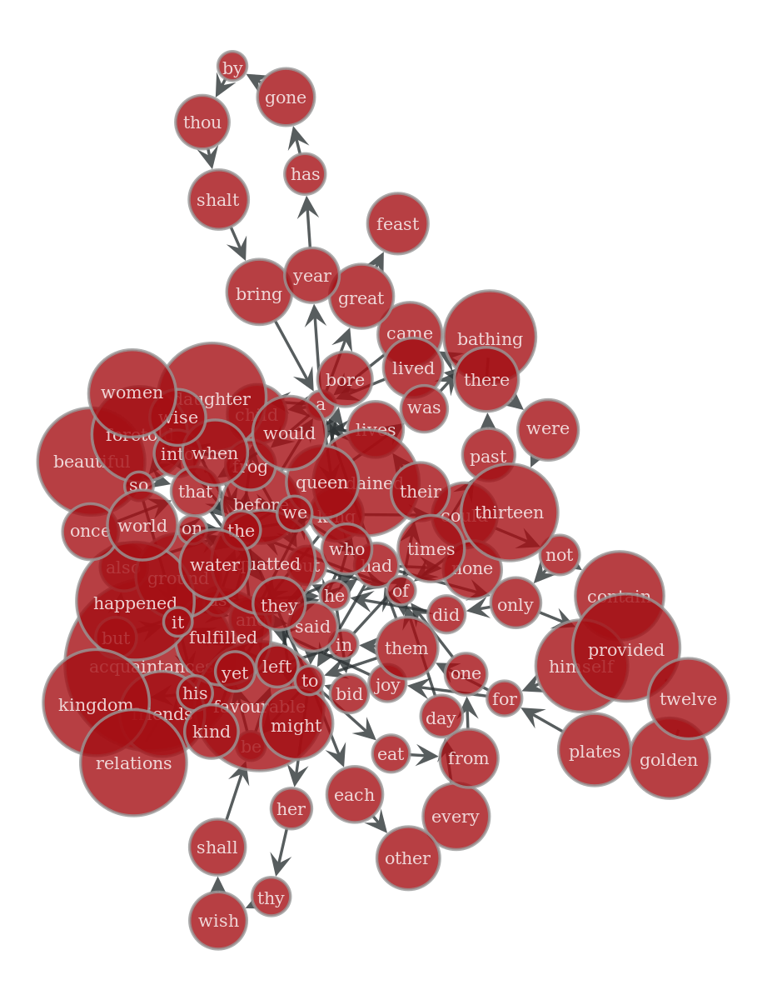

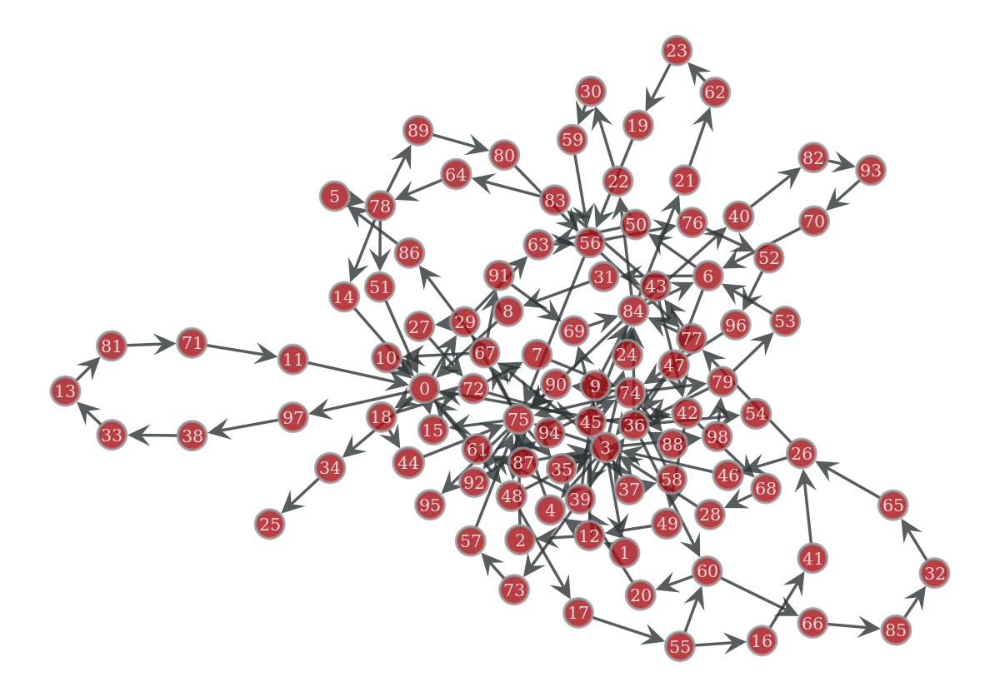

Trophic Incoherence
0.9116453965643069
Trophic Levels
[ 0.         -0.69357225 -0.48281865 -0.58008408 -0.55055957 -0.75692646
 -0.31298357 -0.37678934 -0.10432786 -0.58860889 -0.31430605  0.
 -0.80706043  0.         -0.41054182  0.92071156 -1.07637035 -0.79759083
 -0.60091491 -0.15128179 -0.70795594 -0.42834609 -0.4052574  -0.24363656
 -0.55039247  2.         -0.80687362 -0.220571   -0.66079029 -0.01814317
 -0.28981394 -0.20865571 -0.78788216  0.          1.         -0.36933047
 -0.34961454 -0.89563764  0.         -0.65651691 -0.4791574  -0.94162199
 -0.82220273 -1.23896273 -0.37974589 -0.4937201  -0.69347885 -0.44653382
 -0.38406295 -0.81463158 -0.00320418 -0.41054182 -0.19475343 -0.34427982
  0.65038546 -1.21111872 -0.05892702 -0.32455688 -0.61310874 -0.17437048
 -0.75939498 -0.32825845 -0.33599132  0.30657521 -0.96037667 -0.79737789
 -0.76889071 -0.62861211 -0.74149651 -0.1660364  -0.35452703  0.
 -0.42299884 -0.4905369  -0.33057984 -0.15857687 -0.12684022 -0.79501575
 -0.82108364 

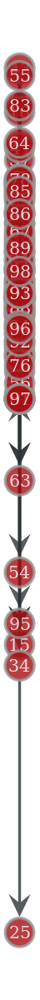

Betweenness Centrality
[0.28174035 0.01830423 0.00722701 0.30428287 0.0223543  0.04744372
 0.09584273 0.02331369 0.02535241 0.01162474 0.02223859 0.05964654
 0.03930951 0.05806859 0.01559015 0.         0.03439231 0.06438039
 0.04373779 0.03029665 0.02220352 0.0287187  0.02134792 0.02977067
 0.03528416 0.         0.07815415 0.01595834 0.02034505 0.07958658
 0.0218739  0.02482643 0.03187461 0.0575426  0.00988849 0.01821716
 0.16174956 0.03250888 0.05701662 0.11210464 0.0287187  0.0349183
 0.03924639 0.03921834 0.01103896 0.06245488 0.02377621 0.04213805
 0.17608612 0.01017002 0.00983765 0.01559015 0.02217547 0.0085034
 0.         0.06490637 0.18896486 0.01233807 0.00544042 0.02239989
 0.06228347 0.01600944 0.02924469 0.07451785 0.0217126  0.03240059
 0.03082264 0.09392544 0.01981906 0.05029177 0.03029665 0.05912056
 0.04970914 0.01181209 0.10610551 0.27978201 0.02164948 0.15312259
 0.07999158 0.04508636 0.03029665 0.05859457 0.02924469 0.02118662
 0.22770506 0.03134862 0.04691774 0.01821

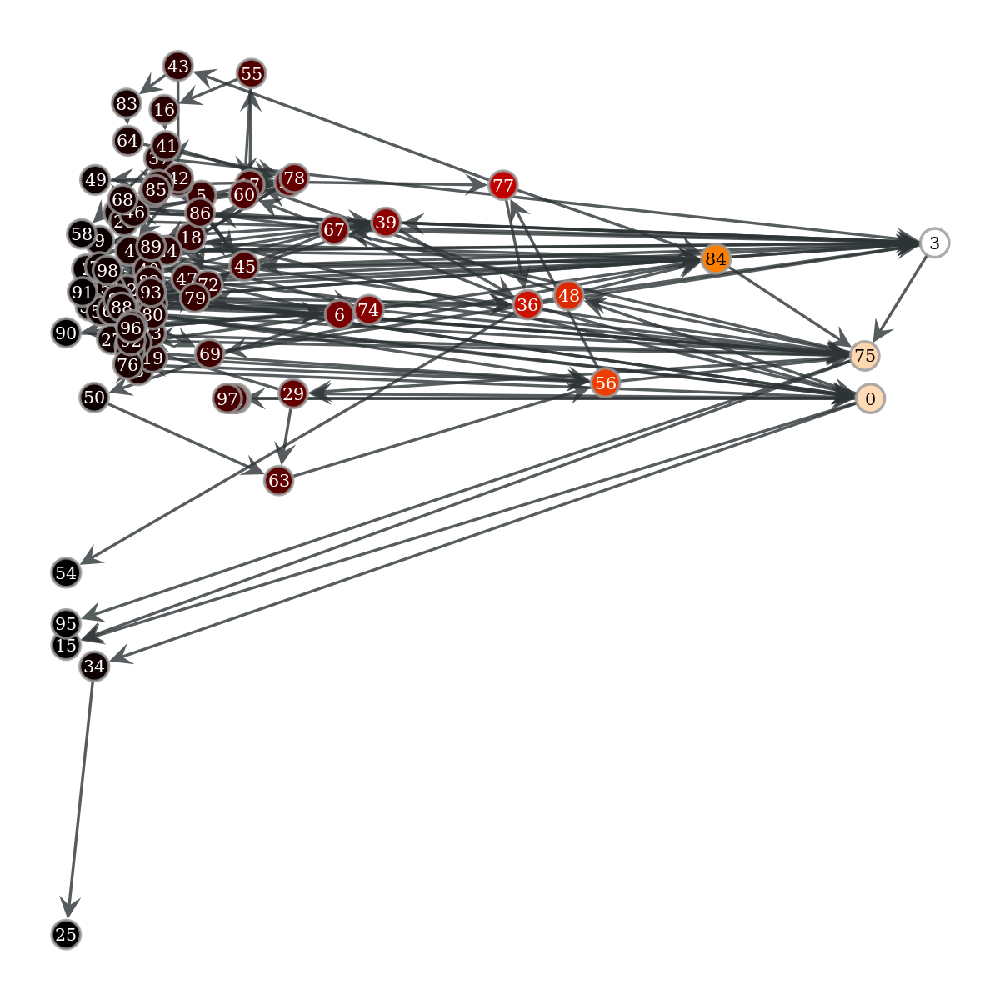

Closeness Centrality
[0.22222222 0.1641541  0.18215613 0.24873096 0.21585903 0.15100154
 0.19066148 0.18114603 0.18421053 0.18773946 0.18317757 0.18421053
 0.19483101 0.12173913 0.18421053 0.         0.15530903 0.13225371
 0.17013889 0.19405941 0.17223199 0.12548015 0.1416185  0.1641541
 0.1873805  0.         0.2172949  0.14759036 0.20164609 0.17223199
 0.16360601 0.15730337 0.15481833 0.109375   1.         0.2
 0.24810127 0.20675105 0.09929078 0.20675105 0.11212815 0.18114603
 0.15217391 0.15030675 0.18215613 0.17948718 0.20247934 0.20081967
 0.21030043 0.1638796  0.16306156 0.18421053 0.15555556 0.16144975
 0.         0.15076923 0.23728814 0.18215613 0.18148148 0.19367589
 0.15506329 0.18317757 0.14223512 0.19291339 0.15100154 0.18081181
 0.1202454  0.18773946 0.16955017 0.1873805  0.16225166 0.15730337
 0.17162872 0.15530903 0.21875    0.22022472 0.13592233 0.2396088
 0.17562724 0.20545073 0.19444444 0.1372549  0.125      0.13243243
 0.22843823 0.13535912 0.13243243 0.2        0.201

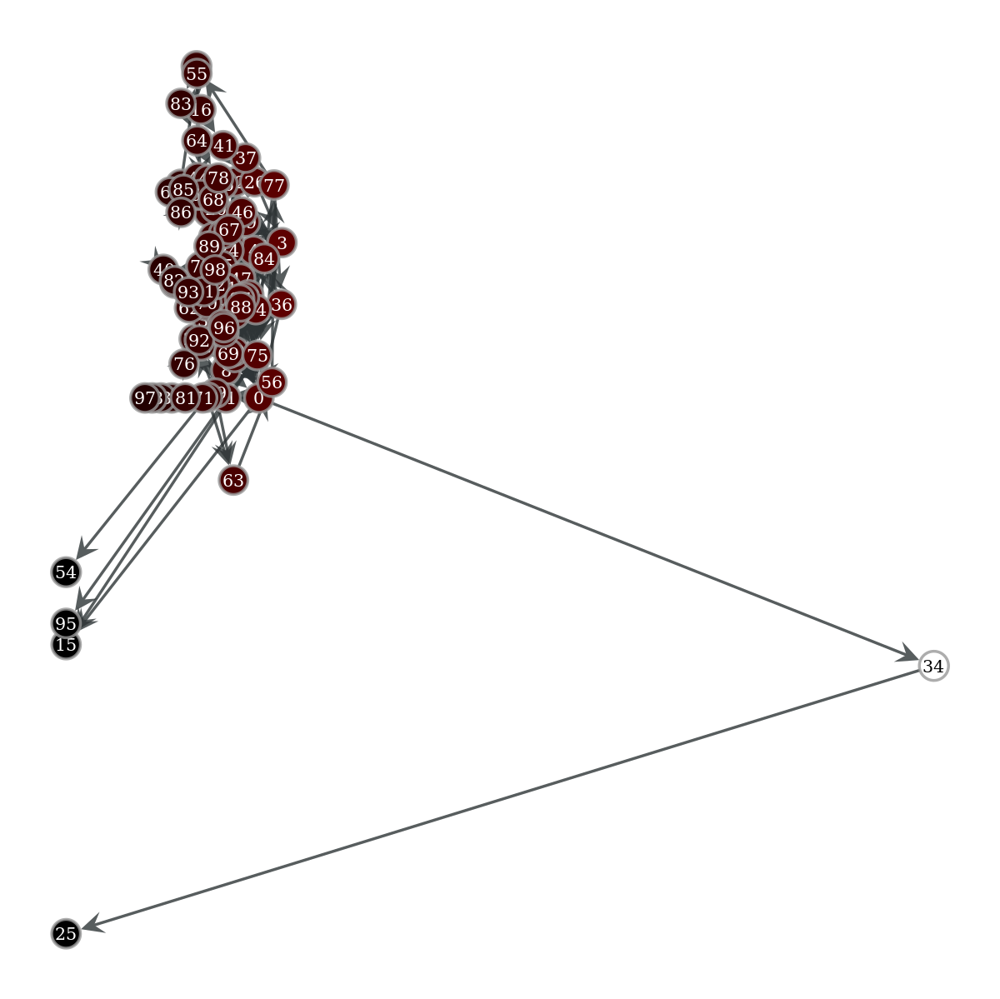

Local Clustering Coeffient
[0.         0.         0.         0.05714286 0.33333333 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         1.
 0.03571429 0.         0.         0.04761905 0.         0.
 0.         0.         0.         0.         0.         0.
 0.16666667 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.1        0.         0.         0.         0.
 0.         0.         0.03571429 0.04411765 0.         0.1
 0.         0.         0.         0.         0.         0.
 0.01818182 0.         0.         1.         0.         0.
 1.         0.         0.         0.         0.         0.
 0.         0.         0.   

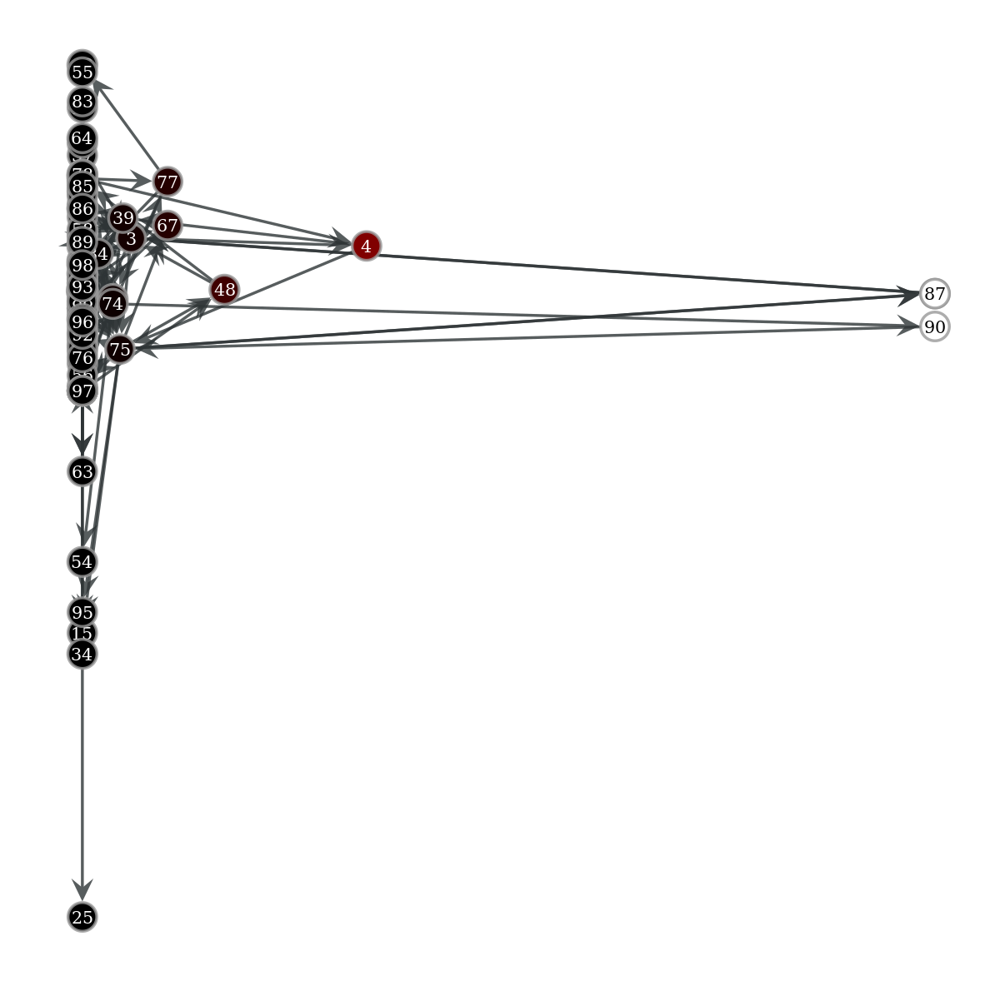

Page Rank
[0.03962493 0.0062568  0.00536638 0.04183287 0.00981113 0.00614894
 0.01945745 0.00654033 0.00803831 0.00511465 0.0051022  0.01032484
 0.01254467 0.00922176 0.00519015 0.01278109 0.00519908 0.007244
 0.00742561 0.00838376 0.00601775 0.00606104 0.00606104 0.00773141
 0.0062568  0.00812379 0.01421227 0.007244   0.00722639 0.01278109
 0.00696394 0.007325   0.00770013 0.00871731 0.00742561 0.00716753
 0.02210185 0.00790811 0.00812379 0.01554162 0.00606104 0.00623129
 0.01072408 0.00662581 0.00496793 0.01434364 0.00785226 0.007325
 0.01278109 0.00636979 0.007325   0.00519015 0.01111915 0.00737672
 0.0065087  0.00796948 0.03224982 0.00615951 0.00517301 0.00773141
 0.00989572 0.00511465 0.00696394 0.01347026 0.00574588 0.00835717
 0.00601775 0.01161228 0.00636979 0.01059368 0.00838376 0.01001507
 0.01112534 0.00511465 0.02806102 0.05040448 0.01094951 0.0169897
 0.01192266 0.01309331 0.00622368 0.00965058 0.00696394 0.00462803
 0.02999281 0.00692715 0.0051022  0.00716753 0.00777503 0

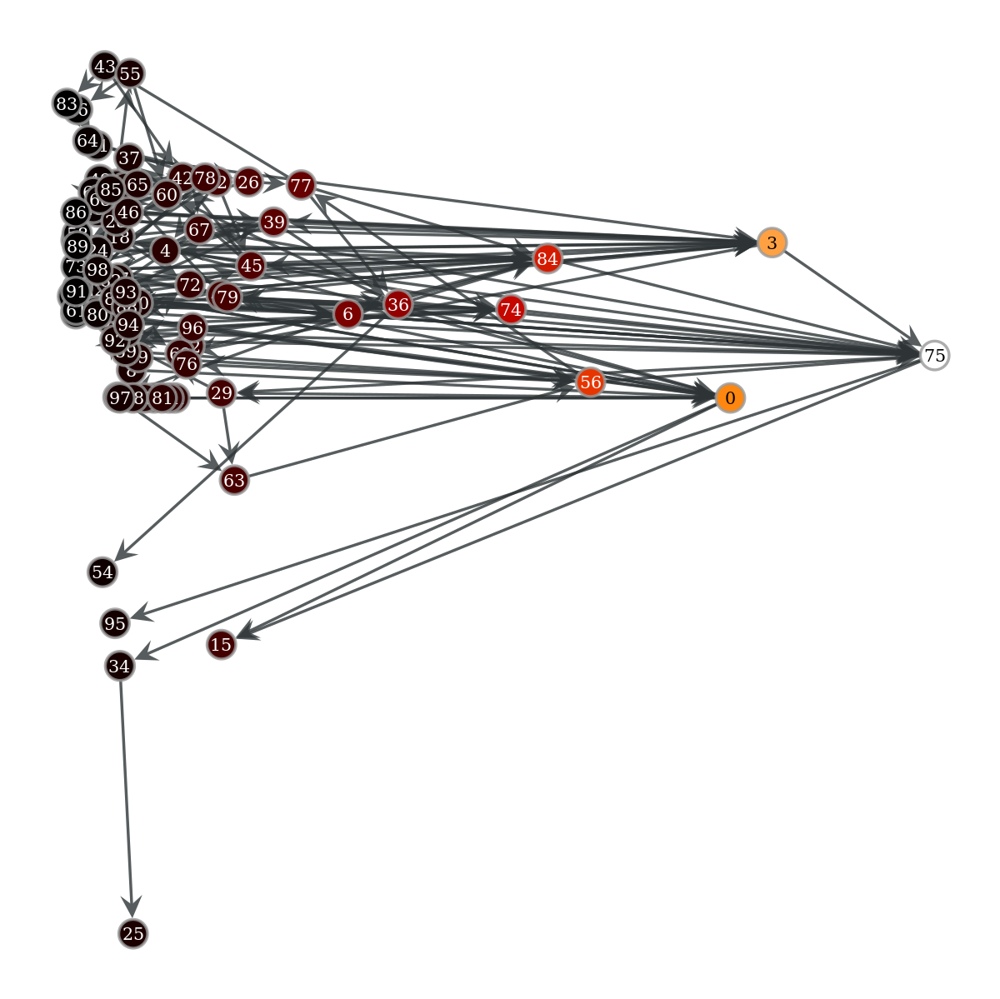

In [6]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import string
import re
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

plt.switch_backend("cairo")
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 23))

#fig1 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
#fig2 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
#fig3 = matplotlib.pyplot.figure(figsize=(20, 15), dpi=80)
#axes1 = fig1.add_axes([0.5, 1, 0.5, 1])
#axes2 = fig2.add_axes([0.5, 1, 0.5, 1])
#axes3 = fig3.add_axes([0.5, 1, 0.5, 1])

# String.puncuation = !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
remPunc = string.punctuation
remPunc = remPunc.replace("!","")
remPunc = remPunc.replace(".","")
remPunc = remPunc.replace("?","")

text = "In times past there lived a king and queen, who said to each other every day of their lives, Would that we had a child! and yet they had none. But it happened once that when the queen was bathing, there came a frog out of the water, and he squatted on the ground, and said to her: Thy wish shall be fulfilled; before a year has gone by, thou shalt bring a daughter into the world. And as the frog foretold, so it happened; and the queen bore a daughter so beautiful that the king could not contain himself for joy, and he ordained a great feast. Not only did he bid to it his relations, friends, and acquaintances, but also the wise women, that they might be kind and favourable to the child. There were thirteen of them in his kingdom, but as he had only provided twelve golden plates for them to eat from, one of them had to be left out."
table = str.maketrans(dict.fromkeys(remPunc))
text_nopunc = text.translate(table)

words = re.findall(r"[\w']+|[.,!?;]", text_nopunc.lower())

words_table = str.maketrans(dict.fromkeys(string.punctuation))
words_table_nopunc = text.translate(words_table).lower().split()

#new_text = text_nopunc.lower()
#print(new_text)
print(words)
print(words_table_nopunc)

#words = new_text.split()
#print(words)

values, counts = np.unique(words_table_nopunc, return_counts=True)
print(counts)
print(values)

N = len(values)
adj = np.zeros( (N, N) )
for i in range(len(values)):
  for j in range(len(values)):
    for z in range(len(words)-1):
      if words[z] == values[i] and words[z+1] == values[j]:
        adj[i][j] += 1
        break;
                         

np.set_printoptions(threshold=np.inf)
#print(adj)

g = Graph()
g.set_directed( True )

edge_weights = g.new_edge_property("double")
g.edge_properties["weight"] = edge_weights
vertex_labels = g.new_vertex_property("string")
g.vertex_properties["labels"] = vertex_labels

v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
  vertex_labels[v[i]] = values[i]
  for j in range(N):
    if adj[i][j] != 0:
      e = g.add_edge( v[i], v[j] )
      edge_weights[e] = adj[i,j]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=edge_weights, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())

#graph_draw(g, vertex_text=vertex_labels, mplfig=ax1)#1
#graph_draw(g, vertex_text=vertex_labels, vertex_fill_color = "#1c71d8", vertex_pen_width = 0, vertex_font_size = 15, edge_pen_width = 5)
graph_draw(g, vertex_text=vertex_labels)
graph_draw(g, vertex_text=g.vertex_index)
#ax1.set_xlim([-35, 35])
#ax1.set_ylim([-40, 40])

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)

print("Trophic Incoherence")
top = 0
bottom = 0
for i in range(g.num_vertices()):
  for j in range(g.num_vertices()):
    top += (adj[i,j])*((h2[j]-h2[i]-1)**2)
    bottom += adj[i,j]
print(top/bottom)

pos1 = g.new_vertex_property("vector<double>")
print("Trophic Levels")
np.set_printoptions(suppress=True)

def normalise(arr, t_min, t_max):
  norm_arr = []
  diff = t_max - t_min
  diff_arr = max(arr) - min(arr)   
  for i in arr:
      temp = (((i - min(arr))*diff)/diff_arr) + t_min
      norm_arr.append(temp)
  return norm_arr

normtc = normalise(h2, 0, 10)
print(h2)
print(normtc)
for i in range(len(g.get_vertices())):
  pos1[g.vertex(i)] = (0, normtc[i])
#graph_draw(g, pos=pos1, vertex_text=vertex_labels, mplfig=ax2)#2
graph_draw(g, pos=pos1, vertex_text=g.vertex_index)
#ax2.set_xlim([-5, 5])


vp, ep = graph_tool.centrality.betweenness(g)
pos2 = g.new_vertex_property("vector<double>")
print("Betweenness Centrality")
print(vp.get_array())
normvp = normalise(vp, 0, 10)
print(normvp)
for i in range(len(g.get_vertices())):
  pos2[g.vertex(i)] = (normvp[i], normtc[i])

#graph_draw(g, pos=pos2, vertex_text=vertex_labels, vertex_size=2, mplfig=axes1)#3
graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vcmap=matplotlib.cm.gist_heat)

cp = graph_tool.centrality.closeness(g)
print("Closeness Centrality")
for i in range(len(g.get_vertices())):
  if (np.isnan(cp[i])):
    cp [i] = 0
print(cp.get_array())
normcp = normalise(cp, 0, 10)
print(normcp)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
  pos3[g.vertex(i)] = (normcp[i], normtc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat)


lc = local_clustering(g)
pos4 = g.new_vertex_property("vector<double>")
print("Local Clustering Coeffient")
print(lc.get_array())
normlc = normalise(lc, 0, 10)
print(normlc)
for i in range(len(g.get_vertices())):
  pos4[g.vertex(i)] = (normlc[i], normtc[i])

#graph_draw(g, pos=pos4, vertex_text=vertex_labels, vertex_size=6, mplfig=axes2)#4
graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=lc, vcmap=matplotlib.cm.gist_heat)

pr = pagerank(g)
pos5 = g.new_vertex_property("vector<double>")
print("Page Rank")
print(pr.get_array())
normpr = normalise(pr, 0, 10)
print(normpr)
for i in range(len(g.get_vertices())):
  pos5[g.vertex(i)] = (normpr[i], normtc[i])

#graph_draw(g, pos=pos5, vertex_text=vertex_labels, vertex_size=2, mplfig=axes3)#5
graph_draw(g, pos=pos5, vertex_text=g.vertex_index, vertex_fill_color=pr, vcmap=matplotlib.cm.gist_heat)

%matplotlib inline
plt.show()


# Converting sentences into graphs Eastern



['以', '前', '有', '个', '国', '王', '和', '王', '后', '一', '直', '没', '有', '孩', '子', '他', '们', '为', '此', '非', '常', '伤', '心', '苦', '恼', '。', '有', '一', '天', '王', '后', '正', '在', '河', '边', '散', '步', '一', '条', '小', '鱼', '把', '头', '浮', '出', '水', '面', '对', '她', '说', '你', '的', '愿', '望', '就', '会', '实', '现', '了', '不', '久', '你', '就', '会', '生', '下', '一', '个', '女', '儿', '的', '。', '过', '了', '一', '段', '时', '间', '那', '条', '小', '鱼', '所', '预', '言', '的', '情', '况', '真', '的', '实', '现', '了', '王', '后', '真', '的', '生', '下', '了', '一', '个', '非', '常', '漂', '亮', '的', '女', '儿', '。', '国', '王', '高', '兴', '得', '时', '时', '刻', '刻', '爱', '不', '释', '手', '决', '定', '举', '行', '一', '个', '大', '型', '宴', '会', '。', '他', '不', '仅', '邀', '请', '了', '他', '的', '亲', '戚', '朋', '友', '和', '外', '宾', '而', '且', '邀', '来', '了', '几', '乎', '所', '有', '的', '女', '巫', '师', '让', '她', '们', '为', '他', '的', '女', '儿', '送', '来', '善', '良', '美', '好', '的', '祝', '愿', '。', '他', '的', '王', '国', '里', '一', '共', '有', '十', '三', '个', '女', '巫', '师', '而', '他', '只', '有', '十', '二',

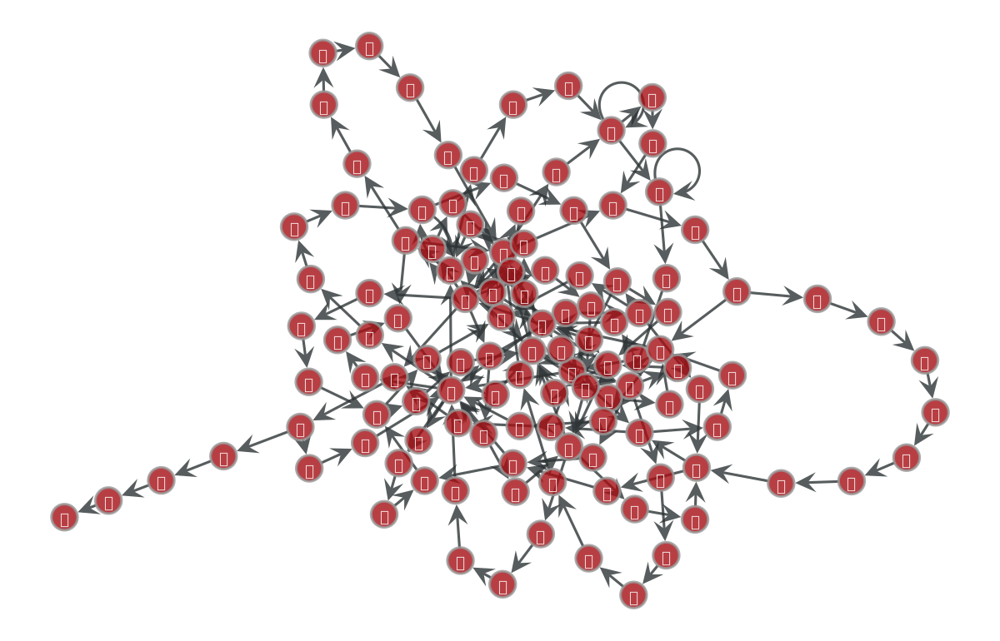

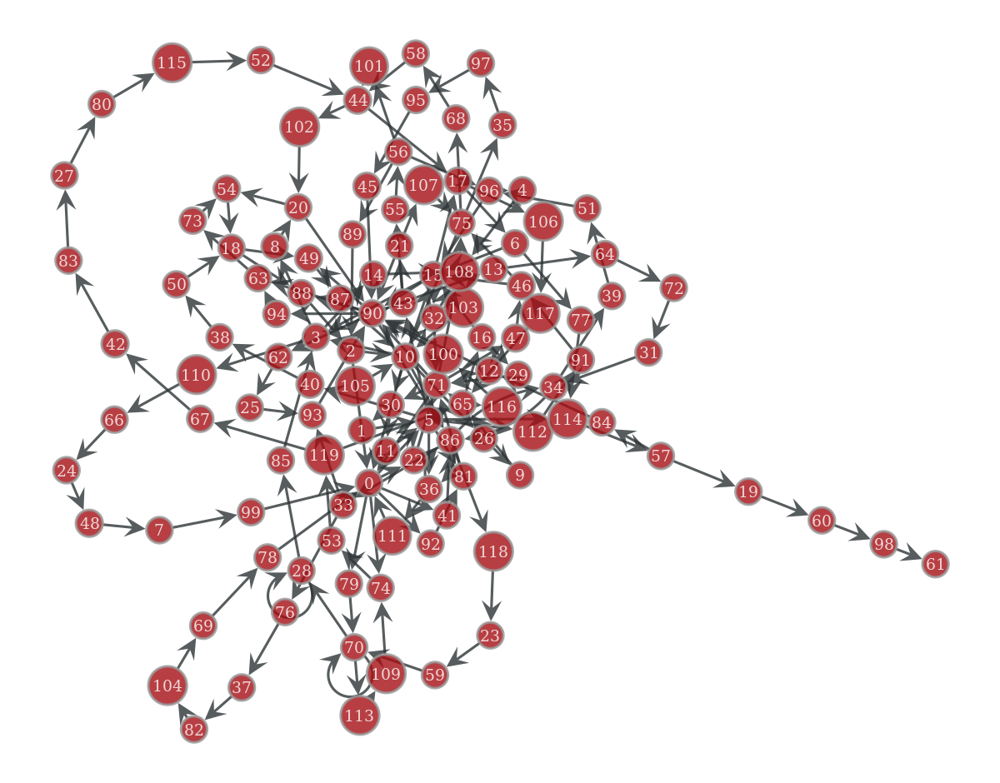

Trophic Incoherence
0.9068374531511687
Trophic Levels
[ 0.         -0.27161688 -0.02886831 -0.00482079 -0.05891257 -0.28823287
 -0.45797037 -0.00137737  0.22389618 -0.37068195 -0.25360688 -0.27161688
  0.236223    0.17219978  0.11169895 -0.13395878 -0.66990389 -0.16410975
  0.71937649  1.28293116  0.45261314 -0.44348612 -0.11158146  0.06981258
 -0.00275473  0.2902541  -0.31214442 -0.28377939  0.05917663 -0.4465334
 -0.25500089  0.05019236 -0.376301   -0.51628293  0.00952322 -0.01447924
 -0.05466664 -0.36877352  0.21557181 -0.10899913 -0.03633053  0.02422491
 -0.51965399 -0.28592609  0.1879698   0.15603188 -0.14574146 -0.18445219
 -0.00206605  0.72217679  0.46747415 -0.22752147  0.0700325  -0.19977498
  1.05339599 -0.62485427 -0.96378245  0.28293116  0.10154111  0.08049396
  2.28293116  4.28293116  0.25156151  0.92300068  0.13153064 -0.42921949
 -0.00344342 -0.63759129  0.01511241 -0.14750941  0.09117534 -0.22316291
  0.0908615   0.98819834  0.35597863 -0.07131628 -0.44252822 -0.0758425

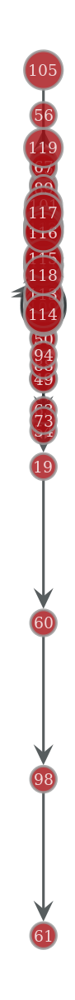

Betweenness Centrality
[0.32567485 0.00413047 0.11873292 0.11724961 0.00875774 0.16442424
 0.04663984 0.04073494 0.03322176 0.0249727  0.20298747 0.00413047
 0.03204672 0.02414186 0.0279817  0.17000037 0.02084224 0.07967763
 0.05768409 0.02478279 0.08567156 0.02515074 0.05114639 0.02070574
 0.04030765 0.01057542 0.02475906 0.04828372 0.04377344 0.00343019
 0.016237   0.02478279 0.0420865  0.11733337 0.0545269  0.02414186
 0.01595214 0.040094   0.01869392 0.02488962 0.01848027 0.01370887
 0.04785643 0.08053052 0.09057352 0.02478279 0.04155391 0.01293653
 0.04052129 0.0467231  0.01890756 0.02510326 0.04892465 0.10741585
 0.03015952 0.04740371 0.04761735 0.06466315 0.01450411 0.02091938
 0.01666429 0.         0.01036177 0.02350093 0.0243555  0.11906542
 0.040094   0.04764279 0.01429046 0.04073494 0.07337511 0.20301053
 0.02456915 0.02371457 0.1072022  0.10498945 0.03988036 0.00930542
 0.04094858 0.04383872 0.04849737 0.01671177 0.04030765 0.04807008
 0.03183307 0.04398709 0.18596676 0.046

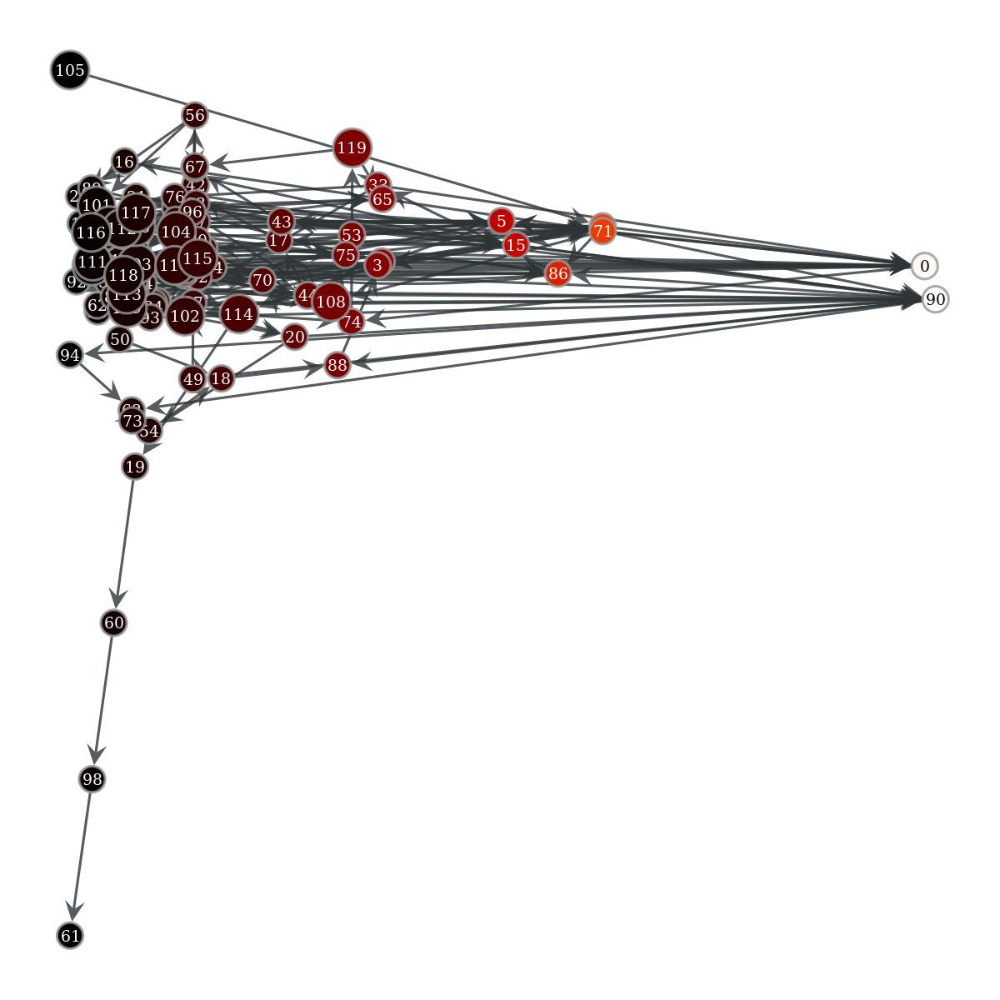

Closeness Centrality
[0.20884956 0.16457462 0.21299639 0.15445026 0.15128205 0.19568823
 0.18759936 0.15147625 0.14372716 0.17744361 0.24229979 0.16457462
 0.1654979  0.1        0.1505102  0.21851852 0.19471947 0.16298343
 0.15344603 0.5        0.16643159 0.17797888 0.19218241 0.09974641
 0.11883182 0.14165666 0.15186615 0.10016978 0.12016293 0.19376026
 0.14285714 0.13882353 0.20068027 0.19063005 0.15945946 0.11313519
 0.16298343 0.10630631 0.11907164 0.13768961 0.10707804 0.1495564
 0.0853835  0.15902965 0.15324675 0.1654979  0.19831933 0.16643159
 0.13318284 0.16503497 0.13409091 0.15838926 0.1353211  0.16010855
 0.13409091 0.15384615 0.18042813 0.13154961 0.13409091 0.10976744
 0.66666667 0.         0.12447257 0.10727273 0.11028037 0.21338156
 0.10727273 0.07951482 0.11919192 0.15070243 0.12202689 0.23694779
 0.12291667 0.11919192 0.13882353 0.21033868 0.09680066 0.1059246
 0.17507418 0.10966543 0.10966543 0.19218241 0.11788212 0.0921875
 0.14337789 0.13516609 0.17507418 0.19633943

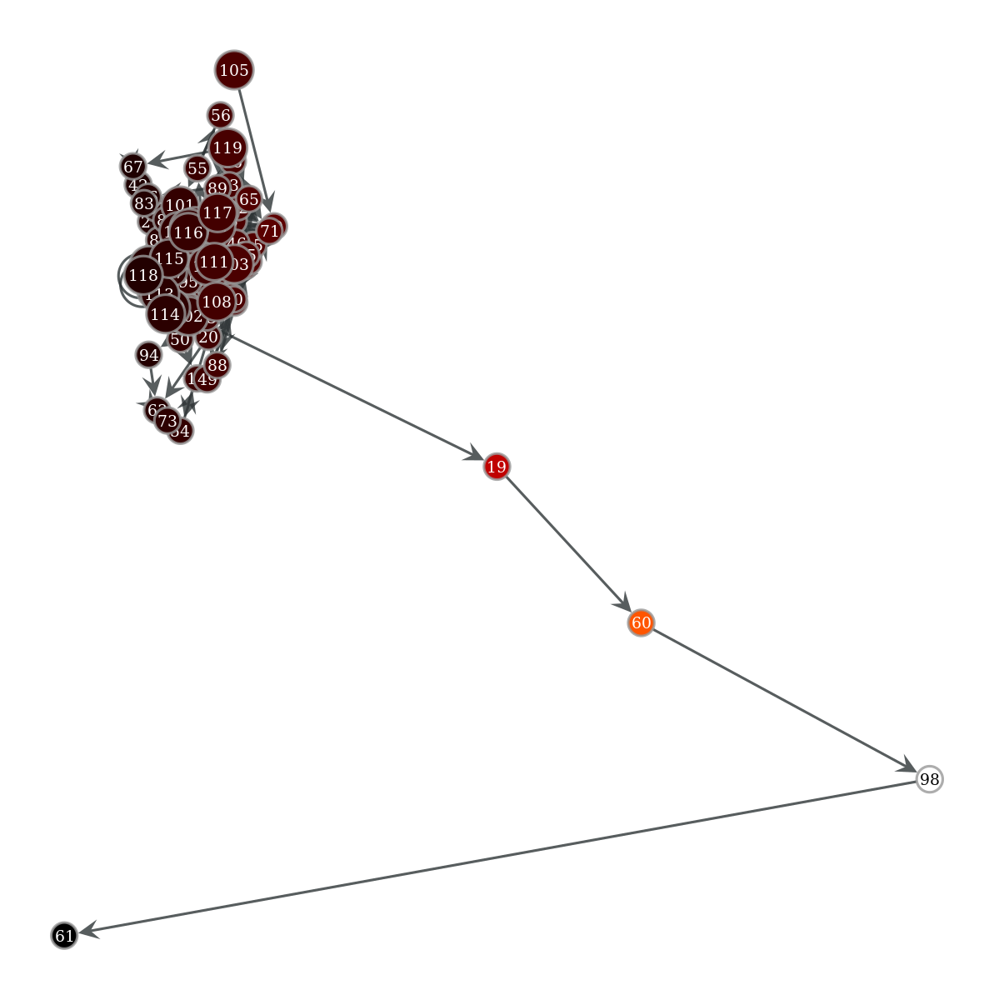

Local Clustering Coeffient
[0.03846154 0.         0.16666667 0.06666667 0.         0.04444444
 0.33333333 0.         0.         0.         0.03636364 0.
 0.         0.         0.         0.05555556 0.         0.16666667
 0.         0.         0.         0.33333333 1.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.33333333 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.16666667 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.33333333 0.         0.
 0.         0.         0.         0.         0.         0.07272727
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.33333333 0.         0.
 0.         0.         0.         0.         0.         0.
 0.01666667 0.         0.         0.         1.         0.
 0.  

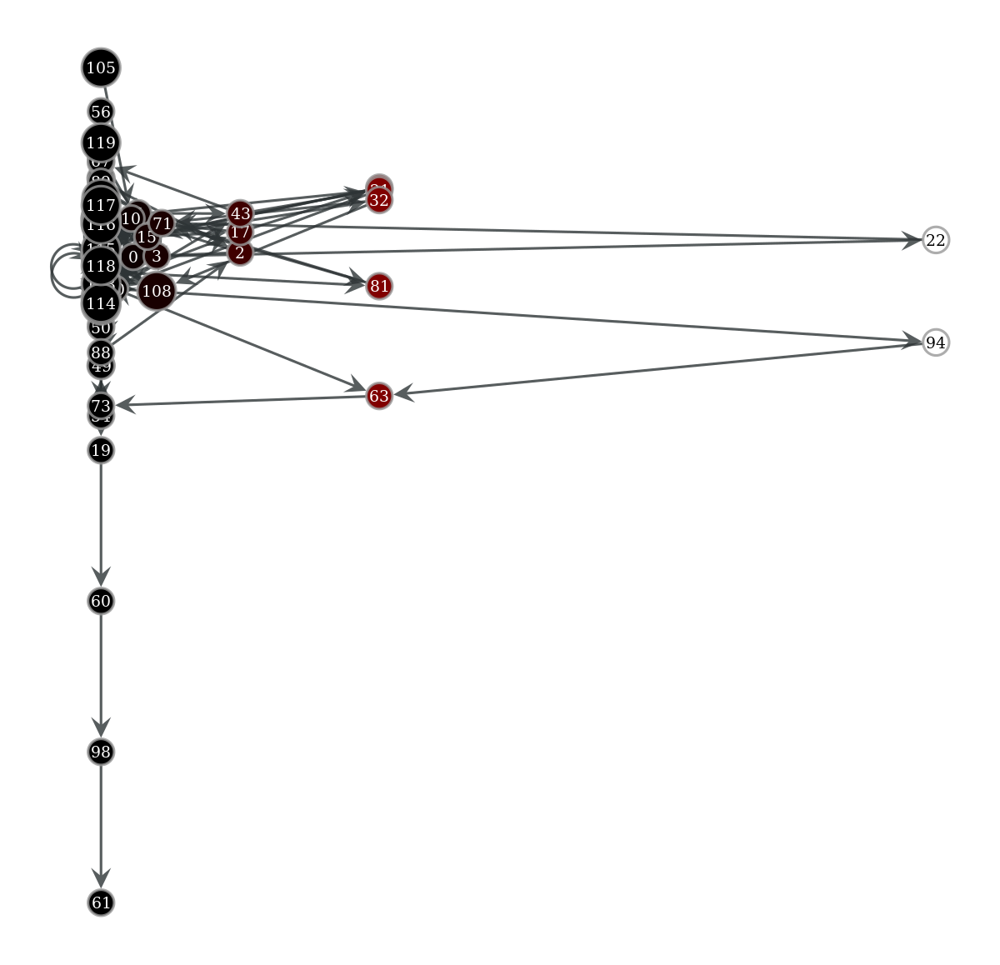

Page Rank
[0.03262988 0.00509915 0.01478001 0.01437179 0.00488739 0.01798309
 0.00621591 0.00692037 0.00536487 0.0060162  0.03009875 0.00509915
 0.00506506 0.0053312  0.00536487 0.01822315 0.00597471 0.01158366
 0.01825663 0.00443788 0.01240753 0.00464135 0.00591543 0.00662191
 0.00626791 0.00582438 0.00555686 0.0069004  0.01063964 0.00383212
 0.00895596 0.00659991 0.00516529 0.00626947 0.0118794  0.00542668
 0.00881707 0.00390169 0.00455726 0.00634161 0.00384047 0.00591543
 0.00624026 0.0078788  0.01510207 0.00665855 0.00915471 0.00469197
 0.00662059 0.01309027 0.00516654 0.00668322 0.0075636  0.01101218
 0.01479081 0.00464135 0.00523801 0.00740003 0.00590554 0.00692148
 0.00506506 0.00605131 0.0053312  0.00986272 0.00582438 0.01652417
 0.005853   0.00582047 0.00542668 0.00572202 0.01702918 0.02399368
 0.00624359 0.00967617 0.01143447 0.01458992 0.00306921 0.00393463
 0.00615658 0.00591543 0.00715819 0.00886859 0.0046093  0.0065971
 0.00443788 0.00581471 0.02341931 0.01241958 0.013090

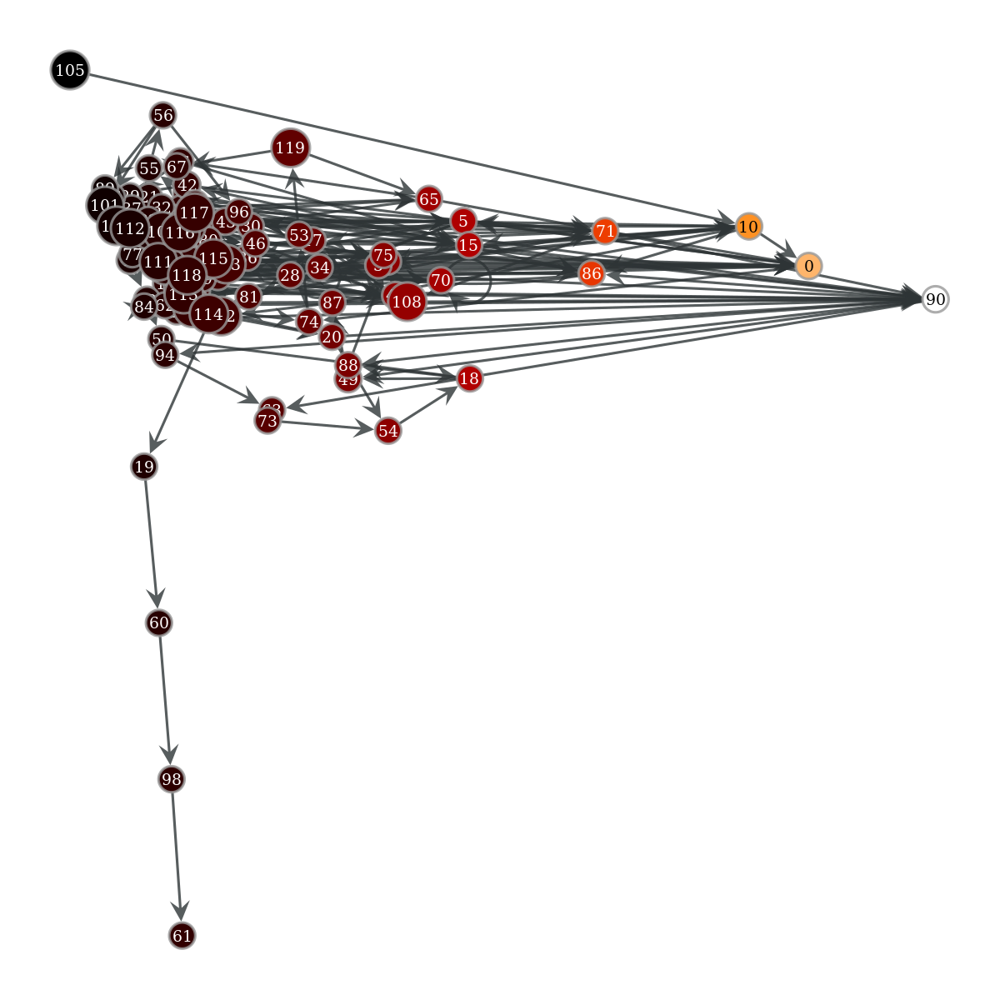

In [ ]:
from graph_tool.inference.util import float16
from graph_tool.all import *
import math
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import string
import re
from scipy import sparse
from scipy.linalg import lu_factor, lu_solve
from scipy.sparse import csr_matrix
from scipy.sparse.linalg import inv

# String.puncuation = !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~
remPunc = string.punctuation
remPunc = remPunc.replace("!","")
remPunc = remPunc.replace(".","")
remPunc = remPunc.replace("?","")
remPunc = remPunc + "，：；、"


text = "以前，有个国王和王后一直没有孩子，他们为此非常伤心苦恼。有一天，王后正在河边散步，一条小鱼把头浮出水面对她说：你的愿望就会实现了，不久你就会生下一个女儿的。过了一段时间，那条小鱼所预言的情况真的实现了，王后真的生下了一个非常漂亮的女儿。国王高兴得时时刻刻爱不释手，决定举行一个大型宴会。他不仅邀请了他的亲戚、朋友和外宾，而且邀来了几乎所有的女巫师，让她们为他的女儿送来善良美好的祝愿。他的王国里一共有十三个女巫师，而他只有十二个金盘子来招待她们进餐，所以他只邀请了十二个女巫师，留下一个没有邀请。"
table = str.maketrans(dict.fromkeys(remPunc))
text_nopunc = text.translate(table)

words = list(''.join(re.findall(r"[\w']+|[.,!?;。！，：；？、]", text_nopunc.lower())))

words_table = str.maketrans(dict.fromkeys((string.punctuation + "。！，：；？、")))
words_table_nopunc = list(text.translate(words_table))

#new_text = text_nopunc.lower()
#print(new_text)
print(words)
print(words_table_nopunc)

#words = new_text.split()
#print(words)

values, counts = np.unique(words_table_nopunc, return_counts=True)
print(counts)
print(values)

N = len(values)
adj = np.zeros( (N, N) )
for i in range(len(values)):
    for j in range(len(values)):
        for z in range(len(words)-1):
            if words[z] == values[i] and words[z+1] == values[j]:
                adj[i][j] += 1
                break;

np.set_printoptions(threshold=np.inf)
#print(adj)

g = Graph()
g.set_directed( True )

edge_weights = g.new_edge_property("double")
g.edge_properties["weight"] = edge_weights
vertex_labels = g.new_vertex_property("string")
g.vertex_properties["labels"] = vertex_labels

v = [ g.add_vertex() for i in range(N) ]
for i in range(N):
    vertex_labels[v[i]] = values[i]
    for j in range(N):
        if adj[i][j] != 0:
            e = g.add_edge( v[i], v[j] )
            edge_weights[e] = adj[i,j]

in_degs = (g.get_in_degrees(g.get_vertices()))
out_degs = (g.get_out_degrees(g.get_vertices()))
imbalance = np.array(in_degs.astype(float) - out_degs.astype(float))
strength = in_degs + out_degs
adjacency = graph_tool.spectral.adjacency(g, weight=edge_weights, vindex=None, operator=False, csr=True).transpose()

laplacian = np.diag(strength) - (adjacency + adjacency.transpose())

graph_draw(g, vertex_text=vertex_labels)
graph_draw(g, vertex_text=g.vertex_index)
#ax1.set_xlim([-35, 35])
#ax1.set_ylim([-40, 40])

remLapl = np.delete((np.delete(laplacian, (0), axis=0)), (0), axis=1)
remImb = np.delete(imbalance, (0), axis=0)

lu, piv = lu_factor(remLapl)
h = lu_solve((lu, piv), remImb)
h2 = np.insert(h, 0, 0, axis=0)

print("Trophic Incoherence")
top = 0
bottom = 0
for i in range(g.num_vertices()):
  for j in range(g.num_vertices()):
    top += (adj[i,j])*((h2[j]-h2[i]-1)**2)
    bottom += adj[i,j]
print(top/bottom)

pos1 = g.new_vertex_property("vector<double>")
print("Trophic Levels")
np.set_printoptions(suppress=True)

def normalise(arr, t_min, t_max):
    norm_arr = []
    diff = t_max - t_min
    diff_arr = max(arr) - min(arr)   
    for i in arr:
        temp = (((i - min(arr))*diff)/diff_arr) + t_min
        norm_arr.append(temp)
    return norm_arr

normtc = normalise(h2, 0, 10)
print(h2)
print(normtc)
for i in range(len(g.get_vertices())):
    pos1[g.vertex(i)] = (0, normtc[i])

graph_draw(g, pos=pos1, vertex_text=g.vertex_index)

vp, ep = graph_tool.centrality.betweenness(g)
pos2 = g.new_vertex_property("vector<double>")
print("Betweenness Centrality")
print(vp.get_array())
normvp = normalise(vp, 0, 10)
print(normvp)
for i in range(len(g.get_vertices())):
    pos2[g.vertex(i)] = (normvp[i], normtc[i])

graph_draw(g, pos=pos2, vertex_text=g.vertex_index, vertex_fill_color=vp, vcmap=matplotlib.cm.gist_heat)

cp = graph_tool.centrality.closeness(g)
print("Closeness Centrality")
for i in range(len(g.get_vertices())):
  if (np.isnan(cp[i])):
    cp [i] = 0
print(cp.get_array())
normcp = normalise(cp, 0, 10)
print(normcp)
pos3 = g.new_vertex_property("vector<double>")
for i in range(len(g.get_vertices())):
  pos3[g.vertex(i)] = (normcp[i], normtc[i])

graph_draw(g, pos=pos3, vertex_text=g.vertex_index, vertex_fill_color=cp, vcmap=matplotlib.cm.gist_heat)

lc = local_clustering(g)
pos4 = g.new_vertex_property("vector<double>")
print("Local Clustering Coeffient")
print(lc.get_array())
normlc = normalise(lc, 0, 10)
print(normlc)
for i in range(len(g.get_vertices())):
    pos4[g.vertex(i)] = (normlc[i], normtc[i])

graph_draw(g, pos=pos4, vertex_text=g.vertex_index, vertex_fill_color=lc, vcmap=matplotlib.cm.gist_heat)

pr = pagerank(g)
pos5 = g.new_vertex_property("vector<double>")
print("Page Rank")
print(pr.get_array())
normpr = normalise(pr, 0, 10)
print(normpr)
for i in range(len(g.get_vertices())):
    pos5[g.vertex(i)] = (normpr[i], normtc[i])

graph_draw(g, pos=pos5, vertex_text=g.vertex_index, vertex_fill_color=pr, vcmap=matplotlib.cm.gist_heat)

%matplotlib inline
plt.show()